# AGH Modelling of Physical Systems Lab 6 (2025 April 8th)

**Original notebook:**

- Sylwester Arabas (sylwester.arabas@agh.edu.pl)
- Emma Ware (ecware@ucdavis.edu)

**Home assignment done by:**
- Marcin Zub (zub@student.agh.edu.pl)

**1. particle-resolved random-sampled state representation for an advection problem**

In [1]:
!pip install open_atmos_jupyter_utils --quiet

In [2]:
""" notebook code targetting 100% `nbqa pylint` score! :) """

from types import SimpleNamespace
import numpy as np
from matplotlib import pyplot
import scipy
from open_atmos_jupyter_utils import show_plot

In [3]:
PARAMS_P = SimpleNamespace(
    n_part=1000,
    norm=1e10,
    dist=scipy.stats.norm(loc=250, scale=50),
)

PARAMS_X = SimpleNamespace(
    span=1000,
    n_cell=50,
)
PARAMS_X.step = PARAMS_X.span / PARAMS_X.n_cell

RNG = np.random.default_rng(seed=44)

In [4]:
def sample(*, params_p, params_x, rng):
    """ samples a particle population specified onto a grid and returns
    a collection indexed by sampling type, with values composed of `cell` and `mult`
    integer-valued arrays with cell IDs and multiplicities, respectively """
    u01 = rng.uniform(0, 1, params_p.n_part)
    return {
        k: {
            'cell': (v['cell'] / params_x.step).astype(int),
            'mult': np.round(v['mult'] * params_p.norm).astype(int),
        }
        for k,v in
        {
            'sampling: uniform random in x': {
                'cell': u01*params_x.span,
                'mult': params_p.dist.pdf(u01 * params_x.span)*params_x.span/params_p.n_part,
            },
            'sampling: constant multiplicity': {
                'cell': params_p.dist.ppf(u01),
                'mult': np.full_like(u01,1)/params_p.n_part,
            }
        }.items()
    }

PARTICLES = sample(params_p=PARAMS_P, params_x=PARAMS_X, rng=RNG)


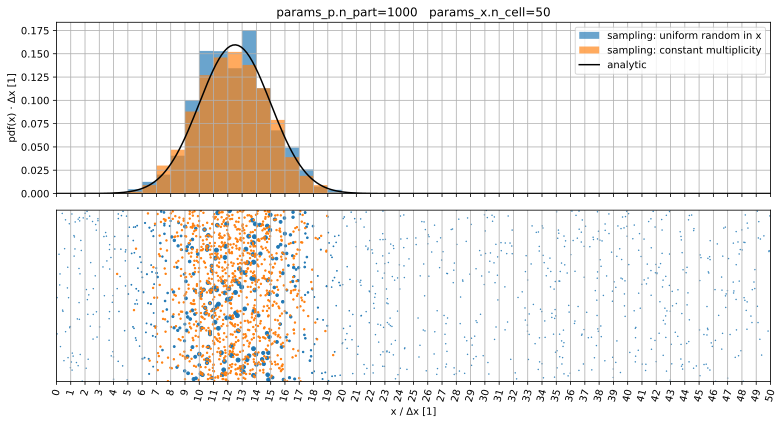

In [5]:
def plot(*, particles, params_p, params_x, rng, title='', shift=0):
    """ plots the particle state as both a histogram as well as population scatter plot
    (with random coordinates shuffled for the purpose of plotting) """
    _, axs = pyplot.subplot_mosaic(
        [['hist'], ['part']],
        figsize=(11, 6),
        sharex=True,
        tight_layout=True,
    )
    u01 = rng.uniform(0, 1, params_p.n_part)
    scale = params_p.norm / params_p.n_part
    for k in particles:
        axs['hist'].hist(
            x=particles[k]['cell'],
            weights=particles[k]['mult'] / params_p.norm,
            bins=params_x.n_cell,
            range=(0, params_x.n_cell),
            label=f'{k}',
            alpha=.666
        )
        axs['part'].scatter(
            particles[k]['cell'] + u01,
            tuple(reversed(u01)),
            s=.25 + 2 * particles[k]['mult'] / scale
        )
    pdf_x = np.linspace(0, params_x.span, 256)
    pdf_y = params_p.dist.pdf(pdf_x - shift)
    axs['hist'].plot(pdf_x / params_x.step, pdf_y * params_x.step, color='black', label='analytic')
    axs['hist'].set_xlim(0, params_x.n_cell)
    axs['hist'].legend()
    axs['hist'].set_ylabel('pdf(x) ⋅ Δx [1]')
    axs['hist'].set_title(title or f'{params_p.n_part=}   {params_x.n_cell=}')
    axs['part'].set_xticks(np.arange(params_x.n_cell + 1))
    axs['part'].xaxis.set_tick_params(rotation=75)
    axs['part'].set_xlabel('x / Δx [1]')
    axs['part'].set_yticks([])
    axs['part'].set_ylim(0,1)
    for axes in axs.values():
        axes.grid()
    show_plot()

plot(particles=PARTICLES, params_p=PARAMS_P, params_x=PARAMS_X, rng=RNG)

**2. Monte-Carlo representation of advection dynamics**

In [6]:
PARAMS_T = SimpleNamespace(
    span = 300,
    n_step = 30,
    wind = 1.5
)
PARAMS_T.step = PARAMS_T.span / PARAMS_T.n_step
PARAMS_T.courant_number = PARAMS_T.wind / PARAMS_X.step * PARAMS_T.step

In [7]:
def advect(*, params_p, params_t, particles, rng):
    """ performs Monte-Carlo advection of the particles """
    probability_of_shift = abs(params_t.courant_number)
    assert probability_of_shift < 1

    for _ in range(params_t.n_step):
        u01 = rng.uniform(0, 1, params_p.n_part)
        for part in particles.values():
            part['cell'] += np.where(probability_of_shift > u01 , 1, 0) * int((abs(params_t.courant_number)/params_t.courant_number))

        pass
advect(particles=PARTICLES, params_t=PARAMS_T, params_p=PARAMS_P, rng=RNG)

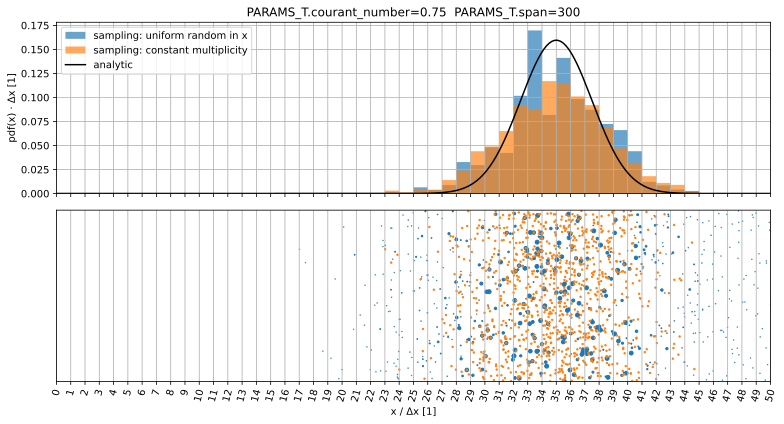

In [8]:
plot(
    particles=PARTICLES,
    params_x=PARAMS_X,
    params_p=PARAMS_P,
    rng=RNG,
    shift=PARAMS_T.wind * PARAMS_T.span,
    title=f'{PARAMS_T.courant_number=:.3g}  {PARAMS_T.span=}'
)

# Extending the result to 2 spatial dimensions

This part of notebook aims at extending the current solution to work with 2-dim data.

In order to do so, the following steps are necessary:
- Defining a two-dimensional constant-in-time flow field (with both components not zero)
- Defining a 2D initial condition condition.

In [9]:
PARAMS_X = SimpleNamespace(
    length_x=1000,
    n_cells_x=32,
)
PARAMS_Y = SimpleNamespace(
    length_y=1000,
    n_cells_y=32,
)

PARAMS_X.step_x = PARAMS_X.length_x / PARAMS_X.n_cells_x
PARAMS_Y.step_y = PARAMS_Y.length_y / PARAMS_Y.n_cells_y

Function `sample_2d()` follows the code convention of the examples above, like `sample()` function.

In [10]:
def sample_2d(*, params_p, params_x, params_y, rng):
    """ Samples a 2D particle population on the grid. """
    u01_x = rng.uniform(0, 1, params_p.n_part)
    u01_y = rng.uniform(0, 1, params_p.n_part)

    return {
        k: {
            'cell_x': (v['cell_x'] / params_x.step_x).astype(int),
            'cell_y': (v['cell_y'] / params_y.step_y).astype(int),
            'mult_x': np.round(v['mult_x'] * params_p.norm).astype(int),
            'mult_y': np.round(v['mult_y'] * params_p.norm).astype(int),

        }
        for k, v in {
            'sampling: uniform random in x and y': {
                'cell_x': u01_x * params_x.length_x,
                'cell_y': u01_y * params_y.length_y,
                'mult_x': params_p.dist.pdf(u01_x * params_x.length_x) * params_x.length_x / params_p.n_part,
                'mult_y': params_p.dist.pdf(u01_y * params_y.length_y) * params_y.length_y / params_p.n_part,

            },
            'sampling: constant multiplicity': {
                'cell_x': params_p.dist.ppf(u01_x),
                'cell_y': params_p.dist.ppf(u01_y),
                'mult_x': np.full_like(u01_x, 1) / params_p.n_part,
                'mult_y': np.full_like(u01_y, 1) / params_p.n_part,
            }
        }.items()
    }

PARTICLES_2D = sample_2d(params_p=PARAMS_P, params_x=PARAMS_X, params_y=PARAMS_Y, rng=RNG)

In [11]:
def plot_2d(*, particles, params_p, params_x, params_y,  rng, title='', shift=0):
    """ Plots the particle state in 2D. """
    _, axs = pyplot.subplot_mosaic(
        [['hist_x', 'hist_y'], ['part_x', 'part_y']],
        figsize=(11, 6),
        sharex=True,
        tight_layout=True,
    )

    u01 = rng.uniform(0, 1, params_p.n_part)
    scale = params_p.norm / params_p.n_part

    # Plotting for each particle sampling method
    for k in particles:
        axs['hist_x'].hist(
            x=particles[k]['cell_x'],
            weights=particles[k]['mult_x'] / params_p.norm,
            bins=params_x.n_cells_x,
            range=(0, params_x.n_cells_x),
            label=f'{k}',
            alpha=.665
        )
        axs['hist_y'].hist(
            x=particles[k]['cell_y'],
            weights=particles[k]['mult_y'] / params_p.norm,
            bins=params_y.n_cells_y,
            range=(0, params_y.n_cells_y),
            label=f'{k}',
            alpha=.665
        )

        axs['part_x'].scatter(
            particles[k]['cell_x'] + u01,
            tuple(reversed(u01)),
            s=.25 + 2 * particles[k]['mult_x'] / scale
        )
        axs['part_y'].scatter(
            particles[k]['cell_y'] + u01,
            tuple(reversed(u01)),
            s=.25 + 2 * particles[k]['mult_y'] / scale
        )

    axs['hist_x'].set_xlim(0, params_x.n_cells_x)
    axs['hist_y'].set_xlim(0, params_y.n_cells_y)

    axs['hist_x'].set_ylabel('pdf(x) ⋅ Δx [1]')
    axs['hist_y'].set_ylabel('pdf(x) ⋅ Δy [1]')

    axs['part_x'].set_xticks(np.arange(params_x.n_cells_x + 1))
    axs['part_y'].set_yticks(np.arange(params_y.n_cells_y + 1))

    axs['part_x'].set_xlabel('x / Δx [1]')
    axs['part_y'].set_xlabel('y / Δy [1]')

    axs['part_x'].set_ylim(0, 1)
    axs['part_y'].set_ylim(0, 1)

    axs['part_x'].xaxis.set_tick_params(rotation=90)
    axs['part_y'].xaxis.set_tick_params(rotation=90)

    axs['part_x'].set_yticks([])
    axs['part_y'].set_yticks([])

    for axes in axs.values():
        axes.grid()

    axs['hist_x'].legend()
    axs['hist_y'].legend()
    axs['hist_x'].set_title(title or f'n_part: {params_p.n_part}, cells: {params_x.n_cells_x}')
    axs['hist_y'].set_title(title or f'n_part: {params_p.n_part}, cells: {params_x.n_cells_x}')

    show_plot()


In [12]:
plot_2d(particles=PARTICLES_2D,
        params_p=PARAMS_P,
        params_x=PARAMS_X,
        params_y=PARAMS_Y,
        rng=RNG
      )

In [13]:
def single_2d_plot(*, particles, params_p, params_x, params_y, rng, title='', shift=0):
    """Shows the particles as a single 2D scatter plot"""
    import matplotlib.pyplot as plt

    fig, ax = plt.subplots(figsize=(8, 6))
    u01 = rng.uniform(0, 1, params_p.n_part)
    scale = params_p.norm / params_p.n_part

    for label, data in particles.items():
        x = data['cell_x']
        y = data['cell_y']

        mult = np.sqrt(data['mult_x'] * data['mult_y'])

        ax.scatter(
            x + u01,
            y + u01,
            s=0.5 + 2 * mult / scale,
            alpha=0.6,
            label=label
        )

    ax.set_xlim(0, params_x.n_cells_x)
    ax.set_ylim(0, params_y.n_cells_y)

    ax.set_xticks(np.arange(params_x.n_cells_x + 1))
    ax.set_yticks(np.arange(params_y.n_cells_y + 1))

    ax.set_xlabel('x')
    ax.set_ylabel('y')

    ax.set_title(title or f'2D particle ({params_p.n_part=})')

    ax.grid(True)
    ax.legend()

    plt.tight_layout()

    plt.show()

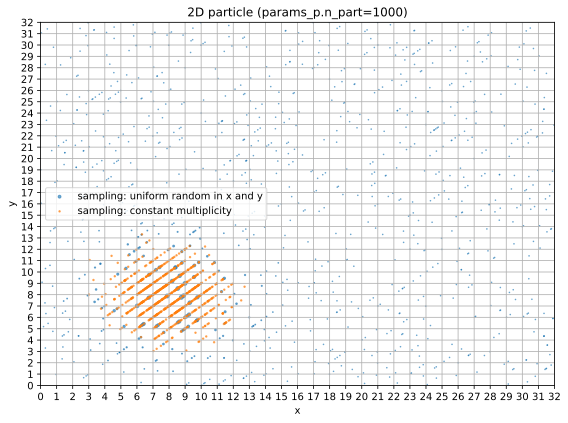

In [14]:
single_2d_plot(
    particles=PARTICLES_2D,
    params_p=PARAMS_P,
    params_x=PARAMS_X,
    params_y=PARAMS_Y,
    rng=RNG)

### Advection

Now, we will perfrom the same process but applied to the advection of particles.

As previously shown, the first plot will ilustrate separate results for both x and y axis, whereas the second on will show the unified result.

In [15]:
PARAMS_T = SimpleNamespace(
    length_x = 300,
    length_y = 300,
    n_step = 30,
    wind_x = 1.5,
    wind_y = 0.5
)

PARAMS_T.step_x = PARAMS_T.length_x / PARAMS_T.n_step
PARAMS_T.step_y = PARAMS_T.length_y / PARAMS_T.n_step
PARAMS_T.courant_number_x = PARAMS_T.wind_x / PARAMS_X.step_x * PARAMS_T.step_x
PARAMS_T.courant_number_y = PARAMS_T.wind_y / PARAMS_Y.step_y * PARAMS_T.step_y

In [16]:
def advect_2d(*, params_p, params_t, particles, rng):
    """ Performs Monte-Carlo advection in 2D """
    probability_of_shift_x = abs(params_t.courant_number_x)
    probability_of_shift_y = abs(params_t.courant_number_y)

    print(f'x: {probability_of_shift_x}\ny: {probability_of_shift_y}')

    assert probability_of_shift_x < 1 and probability_of_shift_y < 1

    for _ in range(params_t.n_step):
        u01 = rng.uniform(0, 1, params_p.n_part)
        for part in particles.values():
            part['cell_x'] += np.where(probability_of_shift_x > u01, 1, 0)
            part['cell_y'] += np.where(probability_of_shift_y > u01, 1, 0)

advect_2d(particles=PARTICLES_2D, params_t=PARAMS_T, params_p=PARAMS_P, rng=RNG)


x: 0.48
y: 0.16


In [17]:
plot_2d(
    particles=PARTICLES_2D,
    params_p=PARAMS_P,
    params_x=PARAMS_X,
    params_y=PARAMS_Y,
    rng=RNG,
    shift=PARAMS_T.wind_x * PARAMS_T.length_x,
    title=f"c_x: {PARAMS_T.courant_number_x}, c_y: {PARAMS_T.courant_number_y}"
)


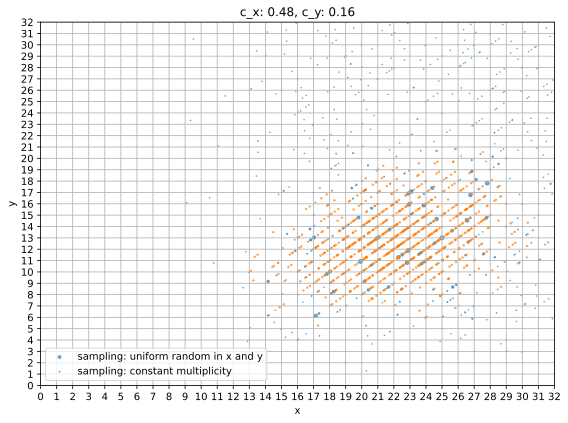

In [18]:
single_2d_plot(
    particles=PARTICLES_2D,
    params_p=PARAMS_P,
    params_x=PARAMS_X,
    params_y=PARAMS_Y,
    rng=RNG,
    shift=PARAMS_T.wind_x * PARAMS_T.length_x,
    title=f'c_x: {PARAMS_T.courant_number_x:.3g}, c_y: {PARAMS_T.courant_number_y:.3g}'
)

## Results



We've managed to extend the monte-carlo advection solver to 2D, 32x32 grid.

Like shown in the provided plots, the evolution of scalar field in time matched the expected results, although some minor numerical diffusions are visible, as expected.

In [19]:
print('Done!')

Done!
